<a href="https://colab.research.google.com/github/srinivasanibmbangalore/OpenCVDeepLearningCertification/blob/master/OpenCV_Course1_Week3_CoinA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import argparse
import os
import shutil
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib
from tqdm import tqdm

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
root_path = '/content/gdrive/My Drive/ml_data/OpenCVCertification/images/'
coinFilePath=root_path+"/CoinsA.png"


matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
image= cv2.imread(coinFilePath, 1)
if ( image.any() == None):
    print("file not detected")
else:
    print("file detected")



file detected


Text(0.5, 1.0, 'Original Image')

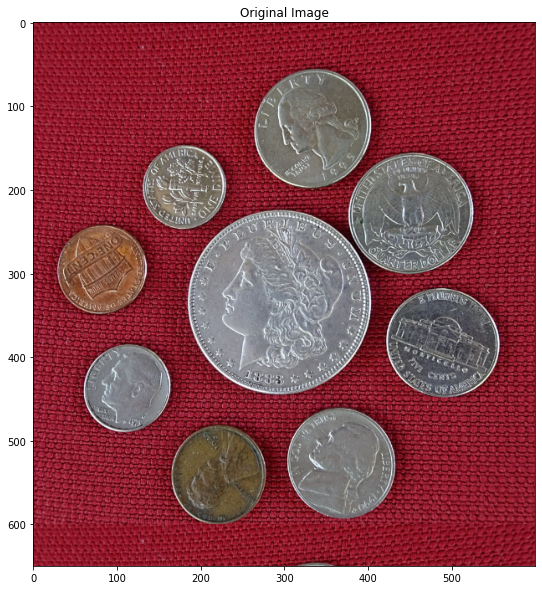

In [ ]:
plt.imshow(image[:,:,::-1])
plt.title("Original Image")

###Step 2.1: Convert Image to Grayscale

In [ ]:
# Convert image to grayscale
# Store it in the variable imageGray
###
imageGray=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
###

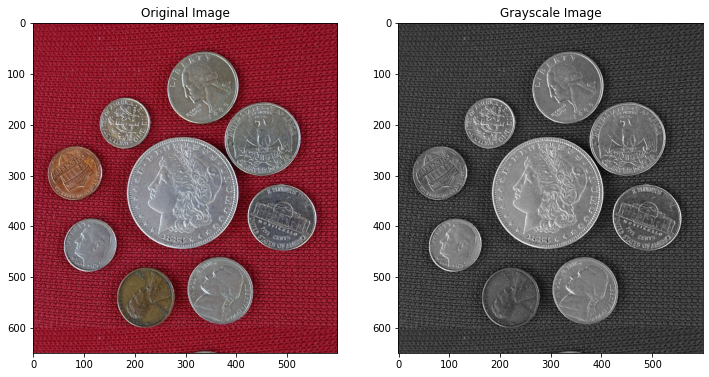

In [ ]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

##2.2 Split into RGB Channels

In [ ]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
###
imageB,imageG,imageR = cv2.split(image)
###


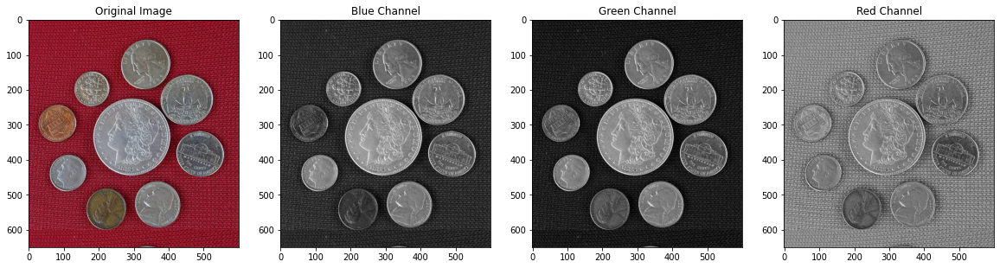

In [ ]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

##Step 3.1: Perform Thresholding

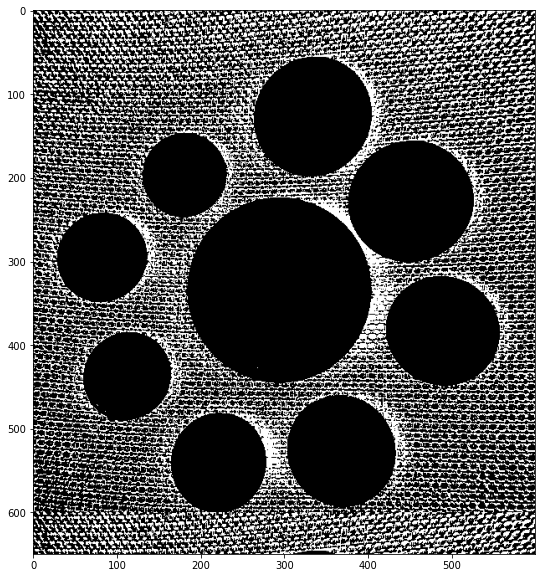

In [ ]:
thresh = 20
maxValue = 255
th, dst = cv2.threshold(imageG, thresh, maxValue, cv2.THRESH_BINARY_INV) ## Tried various values of threshold and maximum value.
plt.imshow(dst)

##Step 3.2: Perform morphological operations

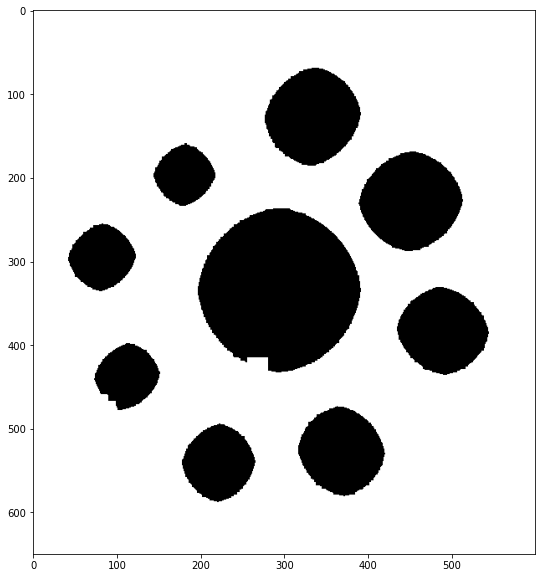

In [ ]:
# Specify Kernel Size
kernelSize = 12 #tried kernel size: 3x3, 5x5, 7x7

# Create Kernel
element = cv2.getStructuringElement(cv2.MORPH_RECT, (2*kernelSize+1, 2*kernelSize+1),
                                    (kernelSize, kernelSize)) # With MORPH_RECT, there is a distortion in shape of coin

# Perform Dilation
imDilated = cv2.dilate(dst, element)
# Perform Erosion
#imClose = cv2.erode(imDilated, element)
plt.imshow(imDilated)

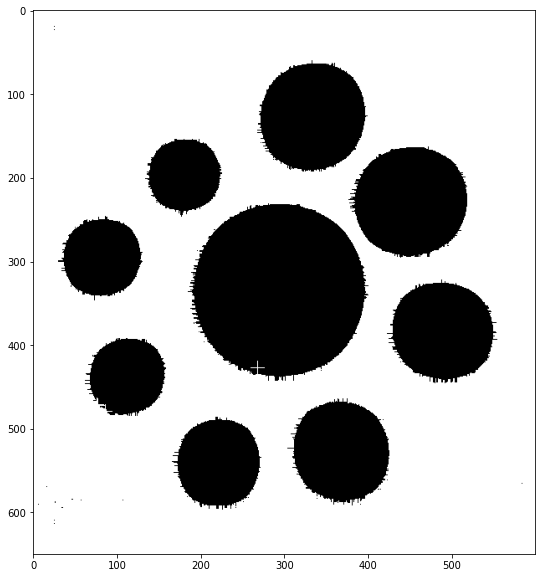

In [ ]:
# Specify Kernel Size
kernelSize = 8 #tried kernel size: 3x3, 5x5, 7x7

# Create Kernel
element = cv2.getStructuringElement(cv2.MORPH_CROSS, (2*kernelSize+1, 2*kernelSize+1),
                                    (kernelSize, kernelSize)) # With MORPH_RECT, there is a distortion in shape of coin

# Perform Dilation
imDilated = cv2.dilate(dst, element)
# Perform Erosion
#imClose = cv2.erode(imDilated, element)
plt.imshow(imDilated)

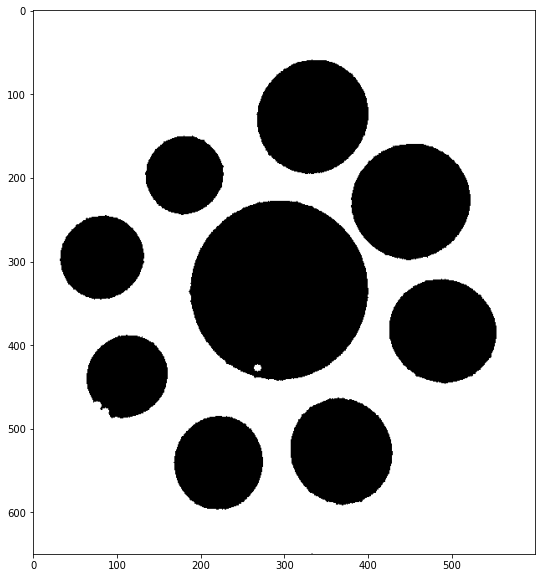

In [ ]:
# Specify Kernel Size
kernelSize = 4 

# Create Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*kernelSize+1, 2*kernelSize+1),
                                    (kernelSize, kernelSize))

# Perform Dilation
imDilated = cv2.dilate(dst, element)
# Perform Erosion
#imClose = cv2.erode(imDilated, element)
plt.imshow(imDilated)

In [ ]:
# Get structuring element/kernel which will be used for dilation
###
kernelSize = 5

# Create Kernel
element = cv2.getStructuringElement(cv2.MORPH_RECT, (2*kernelSize+1, 2*kernelSize+1),
                                    (kernelSize, kernelSize))

###

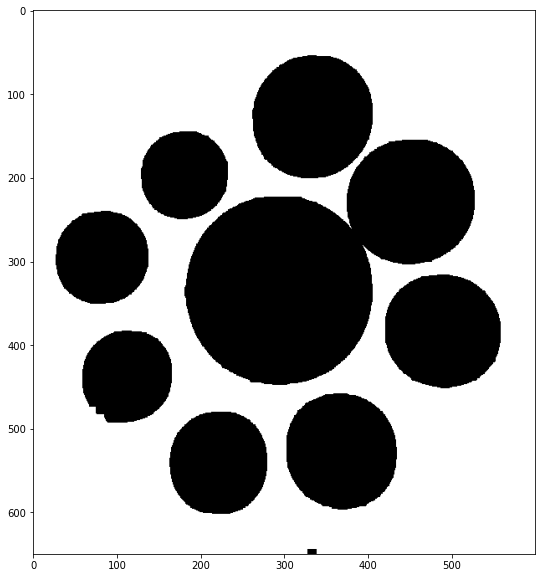

In [ ]:
imClose = cv2.erode(imDilated, element)
plt.imshow(imClose)

In [ ]:
# Get structuring element/kernel which will be used for dilation
###
kernelSize = 6

# Create Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*kernelSize+1, 2*kernelSize+1),
                                    (kernelSize, kernelSize))

###

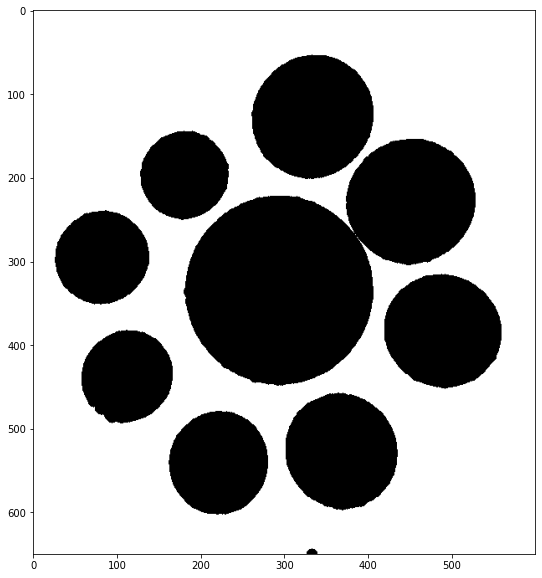

In [ ]:
imClose = cv2.erode(imDilated, element)
plt.imshow(imClose)

## Remove the Black Spot in the base of the image

In [ ]:
# Get structuring element/kernel which will be used for dilation
###
kernelSize = 6

# Create Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*kernelSize+1, 2*kernelSize+1),
                                    (kernelSize, kernelSize))

###

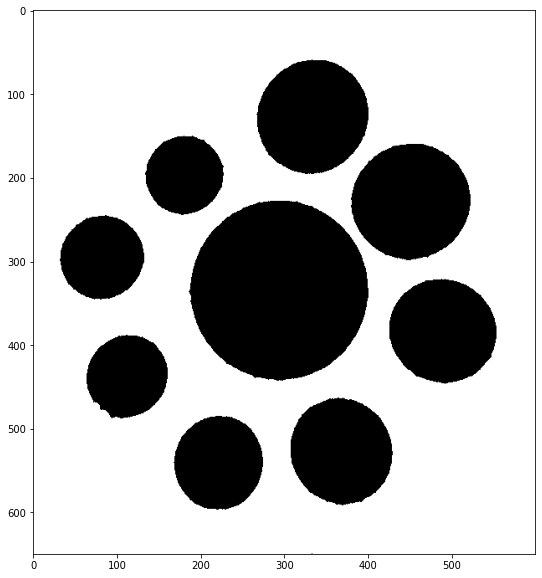

In [ ]:
imDilated2 = cv2.dilate(imClose, element)
plt.imshow(imDilated2)

##Step 4.1: Create SimpleBlobDetector

In [ ]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [ ]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## Detect Coins

In [ ]:
# Detect blobs
###
keypoints = detector.detect(imDilated2)
###

In [ ]:
# Print number of coins detected
###
print(len(keypoints))
###

9


##Step 4.3: Display the detected coins on original image

In [ ]:
imCopy = image.copy()
 
# Mark blobs using image annotation concepts we have studied so far
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(imCopy,(x,y),5,(255,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(imCopy,(x,y),radius,(0,255,0),3)

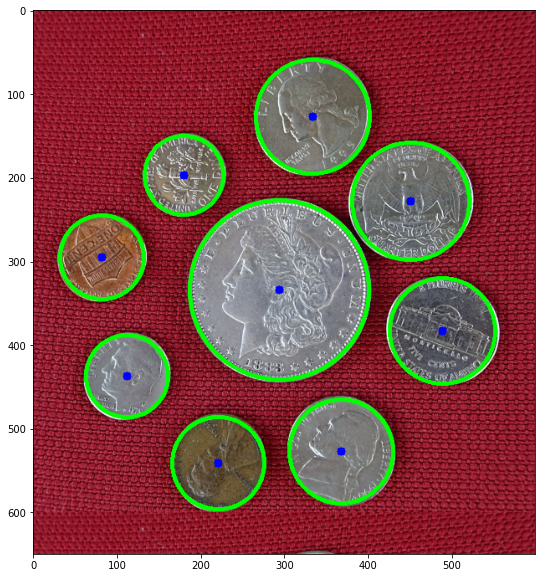

In [ ]:
# Display the final image
###
plt.imshow(imCopy[:,:,::-1])
###

## Step 4.4 Perform Connected Component Analysis
In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

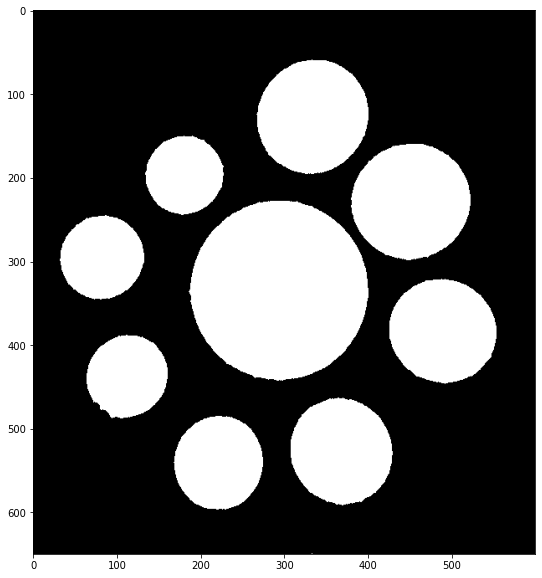

In [ ]:
#Connected component analysis works on white blobs,
#so that it is necessary to inverse the above binary image
#before applying connected component analysis.


mask_inv = cv2.bitwise_not(imDilated2)
plt.imshow(mask_inv)

10


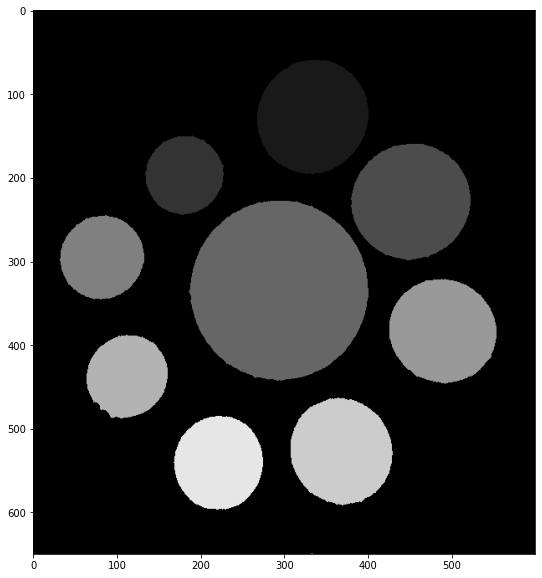

In [ ]:
_, imLabels = cv2.connectedComponents(mask_inv)
plt.imshow(imLabels)
nComponents = imLabels.max()
print(nComponents)

In [ ]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

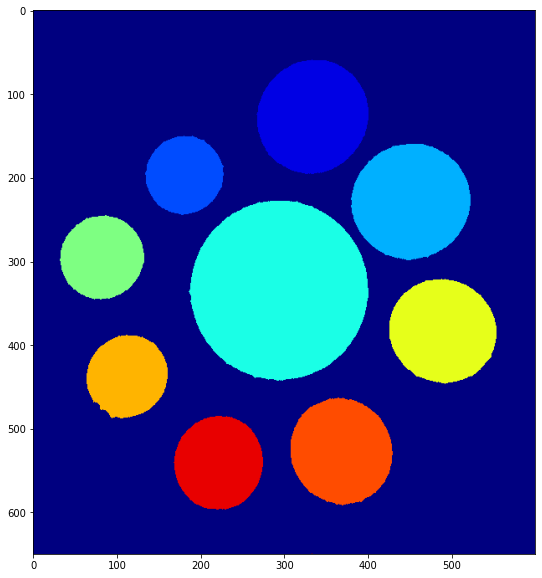

In [ ]:
displayConnectedComponents(imLabels)

## Step 4.5: Detect coins using Contour Detection

In [ ]:
# Find all contours in the image
contours, hierarchy = cv2.findContours(imDilated2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = {}".format(len(contours)))
print("\nHierarchy : \n{}".format(hierarchy))

Number of contours found = 10

Hierarchy : 
[[[ 1 -1 -1 -1]
  [ 2  0 -1 -1]
  [ 3  1 -1 -1]
  [ 4  2 -1 -1]
  [ 5  3 -1 -1]
  [ 6  4 -1 -1]
  [ 7  5 -1 -1]
  [ 8  6 -1 -1]
  [ 9  7 -1 -1]
  [-1  8 -1 -1]]]


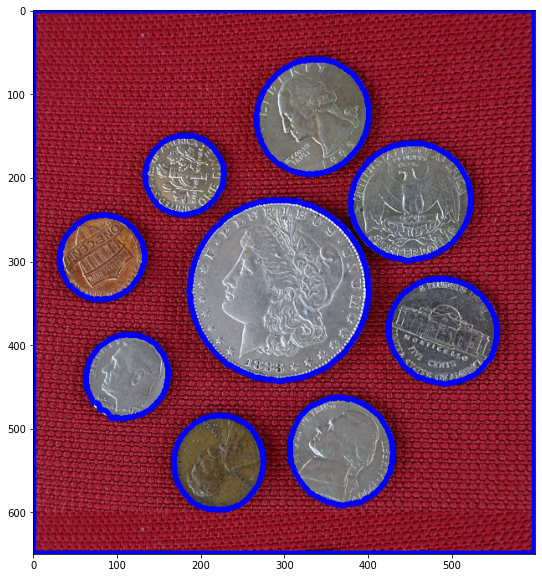

In [ ]:
imCopy1 = image.copy()
cv2.drawContours(imCopy1, contours, -1, (255,0,0), 5)
plt.imshow(imCopy1[:,:,::-1])
#plt.imshow(imCopy1)

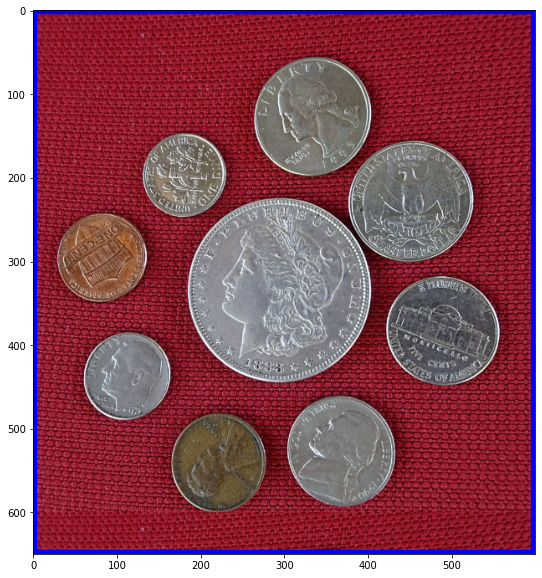

In [ ]:
#Let's only consider the outer contours.
contours1, hierarchy1 = cv2.findContours(imDilated2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
imCopy2 = image.copy()
cv2.drawContours(imCopy2, contours1, -1, (255,0,0), 8)
plt.imshow(imCopy2[:,:,::-1])


In [ ]:
# Print area and perimeter of all contours
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))

Contour #1 has area = 9499.5 and perimeter = 369.74725472927094
Contour #2 has area = 12304.0 and perimeter = 426.75944685935974
Contour #3 has area = 7607.0 and perimeter = 338.1909053325653
Contour #4 has area = 12635.5 and perimeter = 426.0315252542496
Contour #5 has area = 7942.5 and perimeter = 339.60511887073517
Contour #6 has area = 36040.0 and perimeter = 722.3229360580444
Contour #7 has area = 15588.5 and perimeter = 475.9726496934891
Contour #8 has area = 6922.0 and perimeter = 316.87719690799713
Contour #9 has area = 14376.0 and perimeter = 455.5878747701645
Contour #10 has area = 388750.0 and perimeter = 2496.8284270763397


In [ ]:
#Print the area of the biggest Blob
areaBig = cv2.contourArea(contours[9])
perimeterBig = cv2.arcLength(contours[9], True)
print("Contour #{} has area = {} and perimeter = {}".format(10,area,perimeter))

Contour #10 has area = 388750.0 and perimeter = 2496.8284270763397


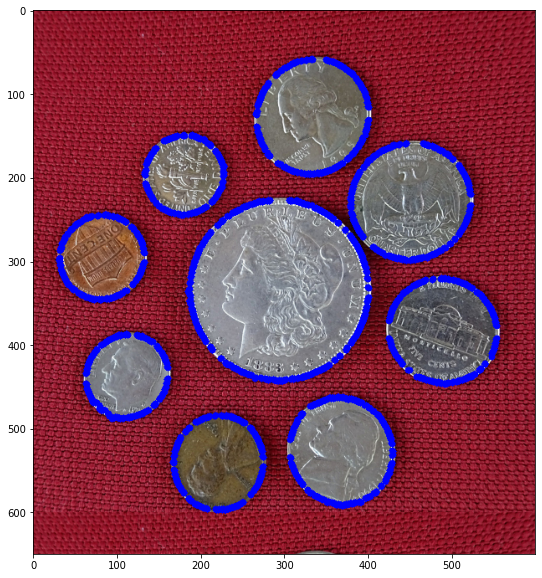

In [ ]:
# Remove this contour and plot others
imCopy3 = image.copy()
for index,cnt in enumerate(contours):
    if ( index != 9 ):
      cv2.drawContours(imCopy3, contours[index], -1, (255,0,0), 8)
plt.imshow(imCopy3[:,:,::-1])

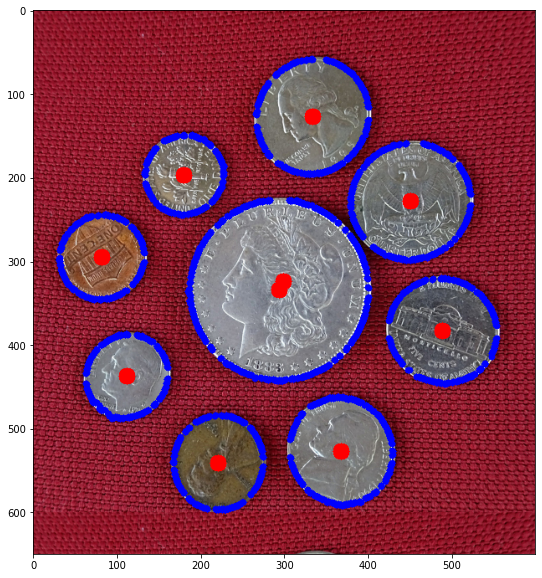

In [ ]:
for cnt in contours:
    # We will use the contour moments
    # to find the centroid
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    
    # Mark the center
    cv2.circle(imCopy3, (x,y), 10, (0,0,255), -1)
plt.imshow(imCopy3[:,:,::-1])

##Assignment Part - B
##Follow the same steps as provided in Assignment Part - A


In [ ]:
#Step1 - Read Image
coinFilePath1=root_path+"/CoinsB.png"
image= cv2.imread(coinFilePath1, 1)
if ( image.any() == None):
    print("file not detected")
else:
    print("file detected")

file detected


Text(0.5, 1.0, 'Original Image')

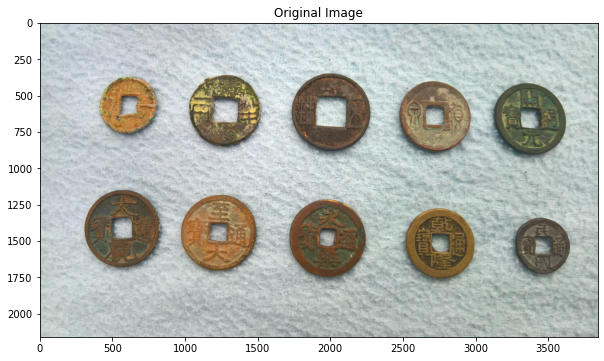

In [ ]:
plt.imshow(image[:,:,::-1])
plt.title("Original Image")

In [ ]:
# Convert to grayscale
# Store in variable imageGray
###
imageGray=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
###

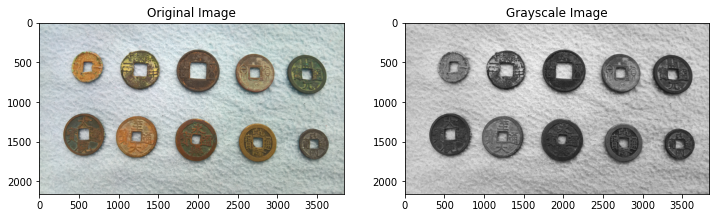

In [ ]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

##Step 2.2: Split Image into R,G,B Channels

In [ ]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
###
imageB,imageG,imageR = cv2.split(image)
###


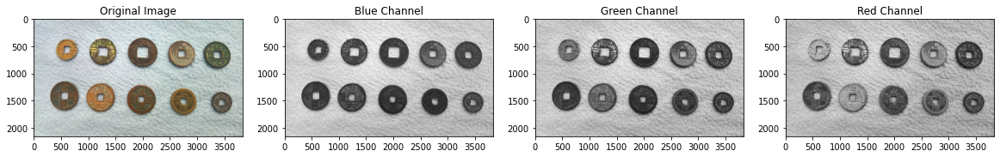

In [ ]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

##Step 3.1: Perform Thresholding
You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings

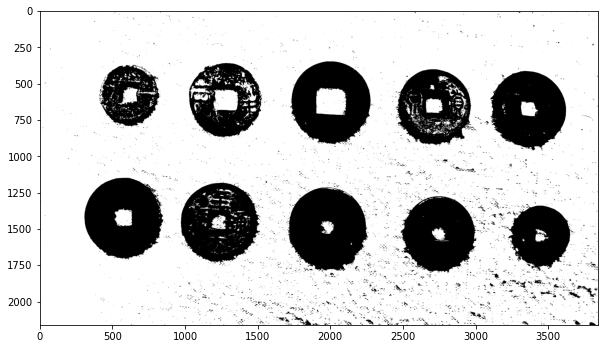

In [ ]:
thresh = 155
maxValue = 255
th, dst = cv2.threshold(imageGray, thresh, maxValue, cv2.THRESH_BINARY) ## Tried various values of threshold and maximum value.
plt.imshow(dst)

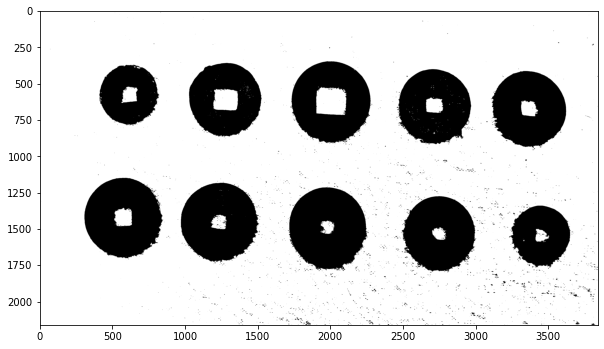

In [ ]:
thresh = 145
maxValue = 255
th, dst = cv2.threshold(imageB, thresh, maxValue, cv2.THRESH_BINARY) ## Tried various values of threshold and maximum value.
plt.imshow(dst)

###Step 3.2: Perform morphological operations
You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [ ]:
# Get structuring element/kernel which will be used for dilation
###
kernelSize = 9

# Create Kernel
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*kernelSize+1, 2*kernelSize+1),
                                    (kernelSize, kernelSize))

###

Text(0.5, 1.0, 'Dilated Image')

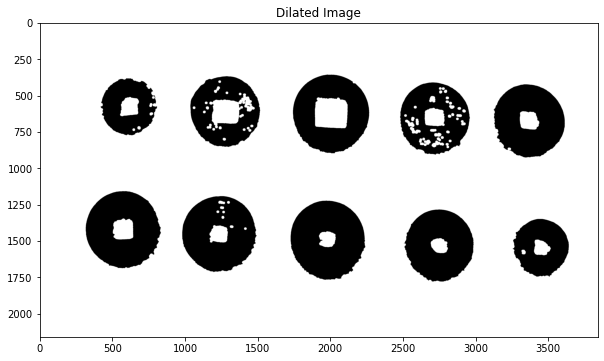

In [ ]:
# Perform Dilation
imDilated = cv2.dilate(dst, element)
# Perform Erosion
#imClose = cv2.erode(imDilated, element)
plt.imshow(imDilated)
plt.title("Dilated Image")

Text(0.5, 1.0, 'Eroded Image')

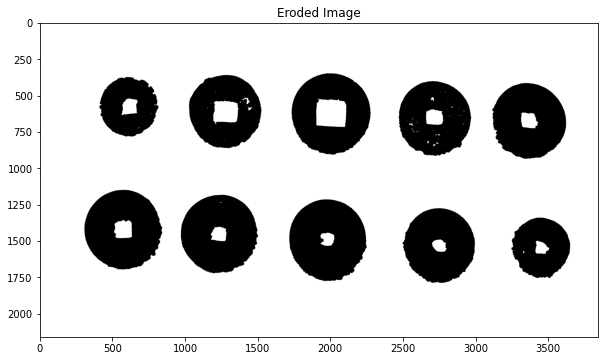

In [ ]:
# Perform Erosion
imDilated2 = cv2.erode(imDilated, element)
# Perform Erosion
plt.imshow(imDilated2)
plt.title("Eroded Image")

Text(0.5, 1.0, 'Eroded Image')

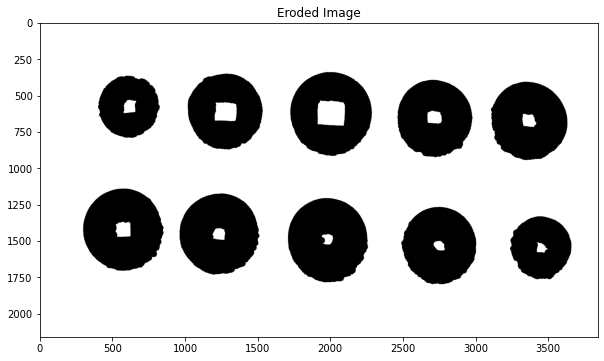

In [ ]:
# Perform Erosion
imDilated2 = cv2.erode(imDilated2, element)
# Perform Erosion
plt.imshow(imDilated2)
plt.title("Eroded Image")

Text(0.5, 1.0, 'Closed Image')

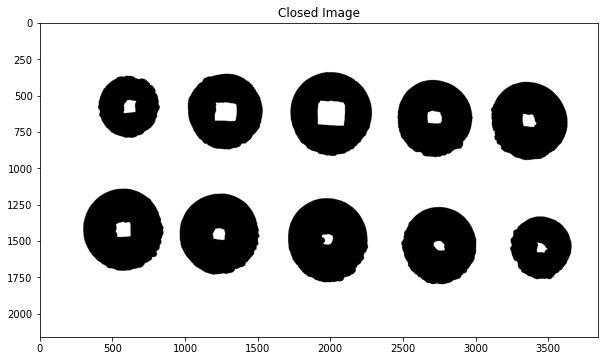

In [ ]:
# Get structuring element/kernel 
# which will be used for closing operation
closingSize = 15

# Selecting an elliptical kernel 
#element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,
            #(2 * closingSize + 1, 2 * closingSize + 1),
            #(30,30))
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(30,30))
          
imageMorphClosed = cv2.morphologyEx(imDilated2, cv2.MORPH_CLOSE, element)
plt.imshow(imageMorphClosed)
plt.title("Closed Image")

Text(0.5, 1.0, 'Opened Image')

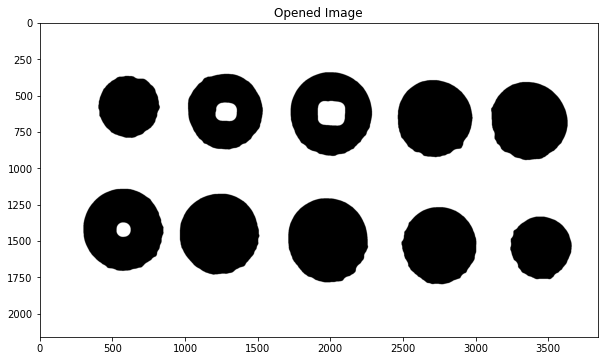

In [ ]:
# Get structuring element/kernel 
# which will be used for closing operation
closingSize = 15

# Selecting an elliptical kernel 
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(90,90))
          
imageMorphOpened = cv2.morphologyEx(imageMorphClosed, cv2.MORPH_OPEN, element)
plt.imshow(imageMorphOpened)
plt.title("Opened Image")

Text(0.5, 1.0, 'Opened Image')

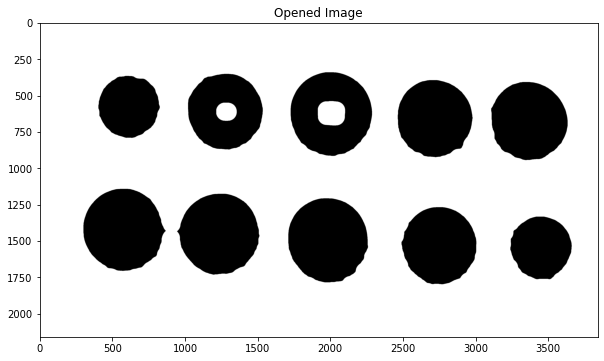

In [ ]:
# Get structuring element/kernel 
# which will be used for closing operation
closingSize = 15

# Selecting an elliptical kernel 
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(120,120))
          
imageMorphOpened = cv2.morphologyEx(imageMorphClosed, cv2.MORPH_OPEN, element)
plt.imshow(imageMorphOpened)
plt.title("Opened Image")

Text(0.5, 1.0, 'Closed Image')

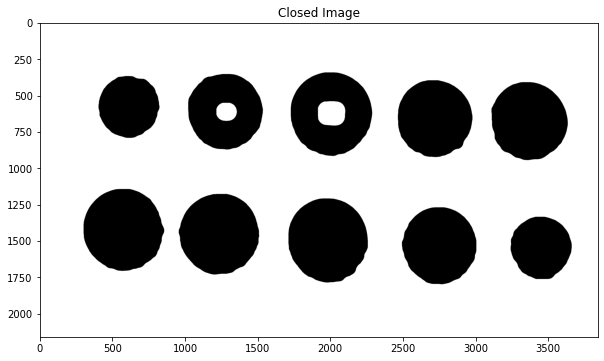

In [ ]:
# Get structuring element/kernel 
# which will be used for closing operation
closingSize = 15

# Selecting an elliptical kernel 
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(90,90))
          
imageMorphClosed= cv2.morphologyEx(imageMorphOpened, cv2.MORPH_CLOSE,element,3)
plt.imshow(imageMorphClosed)
plt.title("Closed Image")

In [ ]:
# Set up the SimpleBlobdetector with default parameters.

params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = False
params.minCircularity = 0.3

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.6

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.6

# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(imageMorphClosed)
print(len(keypoints))




8


In [ ]:
imCopy = image.copy()
 
# Mark blobs using image annotation concepts we have studied so far
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(imCopy,(x,y),5,(255,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(imCopy,(x,y),radius,(0,0,255),16)

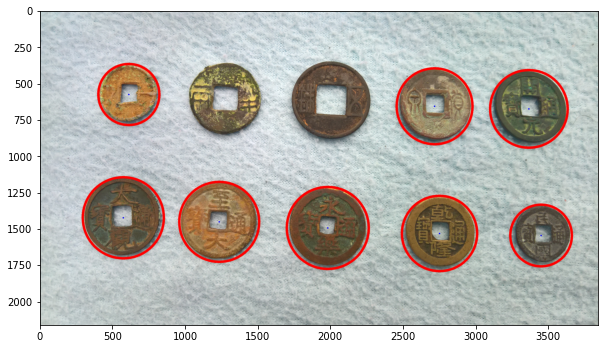

In [ ]:
plt.imshow(imCopy[:,:,::-1]);

##Step 4.4: Perform Connected Component Analysis
Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

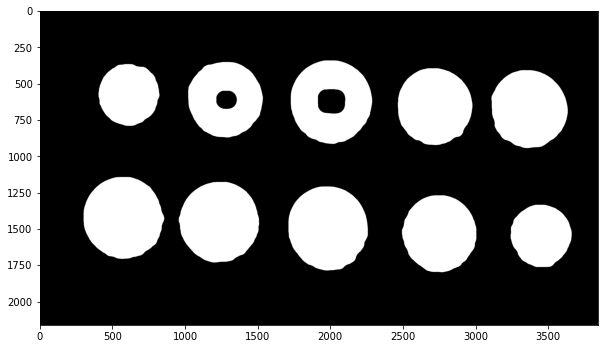

In [ ]:
#Connected component analysis works on white blobs,
#so that it is necessary to inverse the above binary image
#before applying connected component analysis.

mask_inv = cv2.bitwise_not(imageMorphClosed)
plt.imshow(mask_inv)

10


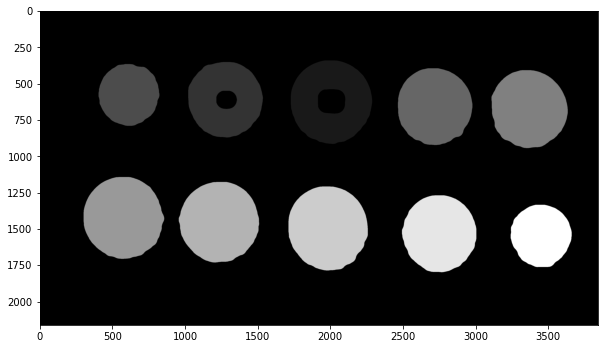

In [ ]:
_, imLabels = cv2.connectedComponents(mask_inv)
plt.imshow(imLabels)
nComponents = imLabels.max()
print(nComponents)

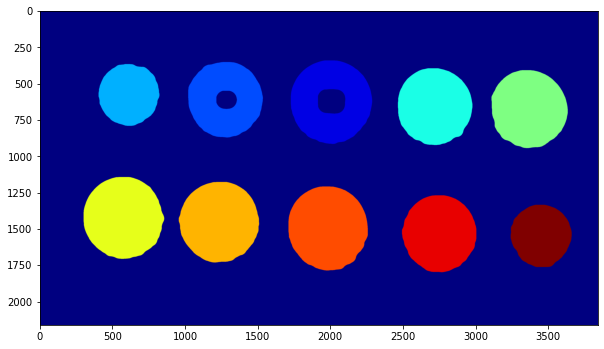

In [ ]:
displayConnectedComponents(imLabels)

##Step 4.5: Detect coins using Contour Detection

In [ ]:
# Find all contours in the image
###
contours, hierarchy = cv2.findContours(imageMorphClosed, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = {}".format(len(contours)))
print("\nHierarchy : \n{}".format(hierarchy))
###

Number of contours found = 13

Hierarchy : 
[[[ 1 -1 -1 -1]
  [ 2  0 -1 -1]
  [ 3  1 -1 -1]
  [ 4  2 -1 -1]
  [ 5  3 -1 -1]
  [ 6  4 -1 -1]
  [ 7  5 -1 -1]
  [ 8  6 -1 -1]
  [ 9  7 -1 -1]
  [10  8 -1 -1]
  [11  9 -1 -1]
  [12 10 -1 -1]
  [-1 11 -1 -1]]]


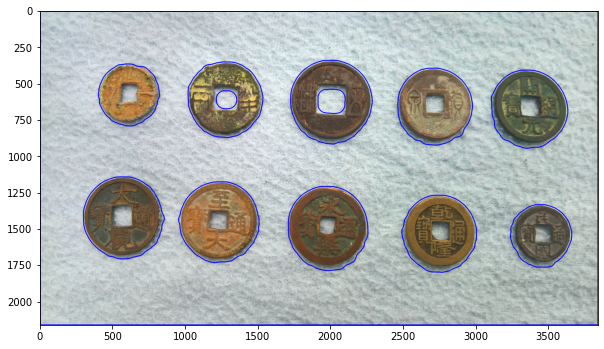

In [ ]:
# Draw all contours
###
imCopy1 = image.copy()
cv2.drawContours(imCopy1, contours, -1, (255,0,0), 5)
plt.imshow(imCopy1[:,:,::-1])
#plt.imshow(imCopy1)
###

In [ ]:
# Print area and perimeter of all contours
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))

Contour #1 has area = 140239.0 and perimeter = 1407.5920495986938
Contour #2 has area = 211555.5 and perimeter = 1725.7413266897202
Contour #3 has area = 249767.0 and perimeter = 1875.925090432167
Contour #4 has area = 238911.0 and perimeter = 1834.895653963089
Contour #5 has area = 243562.0 and perimeter = 1856.8956536054611
Contour #6 has area = 14343.5 and perimeter = 447.7472552061081
Contour #7 has area = 27329.5 and perimeter = 620.7178176641464
Contour #8 has area = 222001.5 and perimeter = 1768.0844728946686
Contour #9 has area = 214709.0 and perimeter = 1743.9007036685944
Contour #10 has area = 139234.0 and perimeter = 1404.964632511139
Contour #11 has area = 210950.5 and perimeter = 1722.628625035286
Contour #12 has area = 252803.5 and perimeter = 1885.6235758066177
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [ ]:
# Remove the inner contours
# Display the result
###
contours1, hierarchy1 = cv2.findContours(imageMorphClosed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print("Number of contours found = {}".format(len(contours1)))
print("\nHierarchy : \n{}".format(hierarchy))
###

Number of contours found = 1

Hierarchy : 
[[[ 1 -1 -1 -1]
  [ 2  0 -1 -1]
  [ 3  1 -1 -1]
  [ 4  2 -1 -1]
  [ 5  3 -1 -1]
  [ 6  4 -1 -1]
  [ 7  5 -1 -1]
  [ 8  6 -1 -1]
  [ 9  7 -1 -1]
  [10  8 -1 -1]
  [11  9 -1 -1]
  [12 10 -1 -1]
  [-1 11 -1 -1]]]


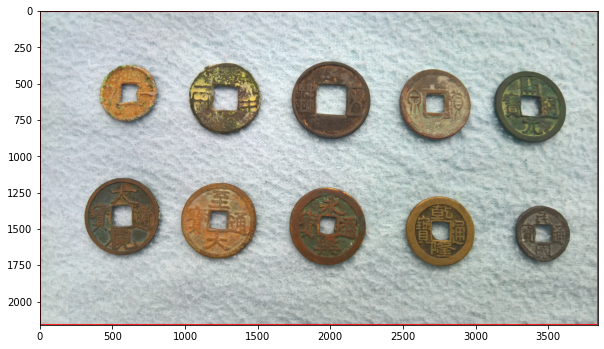

In [ ]:
# Draw only the inner contour
###
imCopy1 = image.copy()
cv2.drawContours(imCopy1, contours1, -1, (0,0,255), 10)
plt.imshow(imCopy1[:,:,::-1])

###

In [ ]:
areas = [cv2.contourArea(c) for c in contours]
max_index = np.argmax(areas)
cnt=contours[max_index]
areaBig = cv2.contourArea(contours[max_index])
print(max_index)
print(areaBig)

12
8288401.0


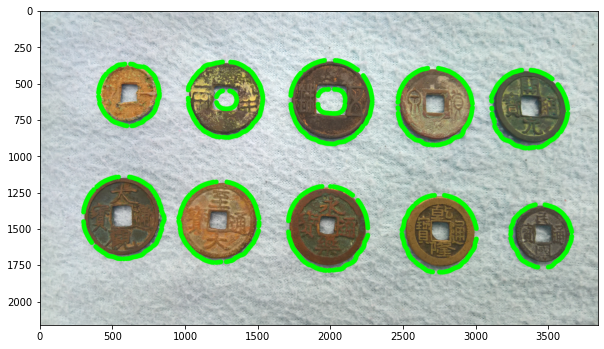

In [ ]:
# Remove this contour and plot others
imCopy3 = image.copy()
for index,cnt in enumerate(contours):
    if ( index != max_index ):
      cv2.drawContours(imCopy3, contours[index], -1, (0,255,0), 32)
plt.imshow(imCopy3[:,:,::-1])

In [ ]:
contours = sorted(contours, key=cv2.contourArea, reverse=False)
areas = [cv2.contourArea(c) for c in contours]
print(areas)

[14343.5, 27329.5, 139234.0, 140239.0, 210950.5, 211555.5, 214709.0, 222001.5, 238911.0, 243562.0, 249767.0, 252803.5, 8288401.0]


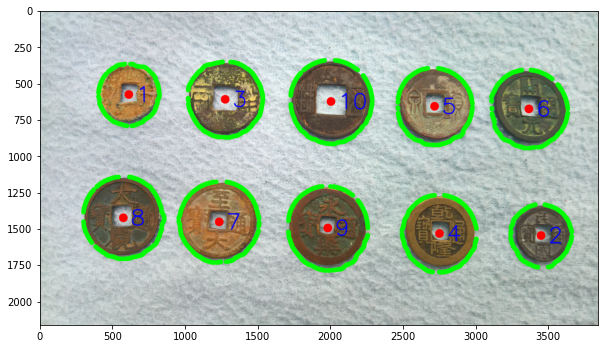

In [ ]:
# font 
font = cv2.FONT_HERSHEY_SIMPLEX 
  
# org 
org = (50, 50) 
  
# fontScale 
fontScale = 5
   
# Blue color in BGR 
color = (255, 0, 0) 
  
# Line thickness of 8 px 
thickness = 8 

imCopy4 = image.copy()
xCntr=0
for index,cnt in enumerate(contours):
    if ( index > 1 and index !=max_index ):
      M = cv2.moments(cnt)
      x = int(round(M["m10"]/M["m00"]))
      y = int(round(M["m01"]/M["m00"]))
      # Mark the center
      cv2.circle(imCopy4, (x,y), 30, (0,0,255), -1)
      cv2.drawContours(imCopy4, contours[index], -1, (0,255,0), 32)
      xCntr+= 1
      cv2.putText(imCopy4,str(xCntr),(x+50,y+50),font,fontScale, color, thickness)
plt.imshow(imCopy4[:,:,::-1])